In [0]:
import os
import torch
import numpy as np
from matplotlib import pylab as plt
import cv2
import torch.nn as nn
from torchsummary import summary
import itertools
from tqdm import tqdm
from IPython.display import clear_output
from copy import deepcopy
from torch.optim import lr_scheduler
import torch.nn.functional as F
import random
from torch.autograd import Variable
import pickle

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!unzip -q /content/drive/My\ Drive/tigr.zip -d dataset1/tigre
!unzip -q /content/drive/My\ Drive/white_tigr.zip -d dataset1/white_tigr

In [0]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [0]:
trainA = []
trainB = []
testA = []
testB = []
from skimage.io import imread
import os
root = 'dataset1'

for root, dirs, files in os.walk(root):
    if root.endswith('tigre'):
        random.shuffle(files)
        for im in files[:3 * len(files) // 4]:
            if im[0] == 'i' :
                trainA.append(cv2.imread(os.path.join(root, im)))
        for im in files[3 * len(files) // 4:]:
            if im[0] == 'i' :
              testA.append(cv2.imread(os.path.join(root, im)))
    if root.endswith('white_tigr'):
        random.shuffle(files)
        for im in files[:3 * len(files) // 4]:
            if im[0] == 'i':
                trainB.append(cv2.imread(os.path.join(root, im)))
        for im in files[3 * len(files) // 4:]:
            if im[0] == 'i':
                testB.append(cv2.imread(os.path.join(root, im)))

In [0]:
for i, im in enumerate(trainA):
    if im is None:
        del trainA[i]
for i, im in enumerate(trainB):
    if im is None:
        del trainB[i]
for i, im in enumerate(testA):
    if im is None:
        del testA[i]
for i, im in enumerate(testB):
    if im is None:
        del testB[i]

In [0]:
for i in range(len(trainA)):
    trainA[i] = cv2.resize(trainA[i], (256, 256),  interpolation = cv2.INTER_LINEAR)
    trainA[i] = cv2.cvtColor(trainA[i], cv2.COLOR_BGR2RGB)
for i in range(len(trainB)):
    trainB[i] = cv2.resize(trainB[i], (256, 256),  interpolation = cv2.INTER_LINEAR)
    trainB[i] = cv2.cvtColor(trainB[i], cv2.COLOR_BGR2RGB)
for i in range(len(testA)):
    testA[i] = cv2.resize(testA[i], (256, 256),  interpolation = cv2.INTER_LINEAR)
    testA[i] = cv2.cvtColor(testA[i], cv2.COLOR_BGR2RGB)
for i in range(len(testB)):
    testB[i] = cv2.resize(testB[i], (256, 256),  interpolation = cv2.INTER_LINEAR)
    testB[i] = cv2.cvtColor(testB[i], cv2.COLOR_BGR2RGB)

In [0]:
trainA = (np.array(trainA, np.float32) / 255 - 0.5) / 0.5
trainB = (np.array(trainB, np.float32) / 255 - 0.5) / 0.5
testA = (np.array(testA, np.float32) / 255 - 0.5) / 0.5
testB = (np.array(testB, np.float32) / 255 - 0.5) / 0.5

In [0]:
from torch.utils.data import DataLoader
batch_size = 3
data_tr = DataLoader(list(zip(np.rollaxis(trainA, 3, 1), np.rollaxis(trainB, 3, 1))), 
                     batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(testA, 3, 1), np.rollaxis(testB, 3, 1))),
                     batch_size=batch_size, shuffle=True)

In [0]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, stride=2, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, x):
        x = self.main(x)
        x = F.avg_pool2d(x, x.size()[2:])
        x = torch.flatten(x, 1)
        return x

In [13]:
summary(Discriminator().to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,136
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,200
    InstanceNorm2d-4          [-1, 128, 64, 64]               0
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,544
    InstanceNorm2d-7          [-1, 256, 32, 32]               0
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,664
   InstanceNorm2d-10          [-1, 512, 16, 16]               0
        LeakyReLU-11          [-1, 512, 16, 16]               0
           Conv2d-12            [-1, 1, 15, 15]           8,193
Total params: 2,764,737
Trainable params: 2,764,737
Non-trainable params: 0
---------------------------

In [0]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels = 32, out_channels = 32, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(32),
            nn.ReLU()
        )
        self.pool0 = nn.Conv2d(in_channels = 32, out_channels = 32, kernel_size = 3, stride = 2, padding = 1)  # 256 -> 128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(64),
            nn.ReLU()
        )
        self.pool1 = nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, stride = 2, padding = 1) # 128 -> 64
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(128),
            nn.ReLU()
        )
        self.pool2 = nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, stride = 2, padding = 1) # 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(256),
            nn.ReLU()
        )
        self.pool3 = nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, stride = 2, padding = 1) # 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels = 512, out_channels = 512, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(512),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels = 512, out_channels = 256, kernel_size = 2, stride = 2)
                    # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = 512, out_channels = 256, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels = 256, out_channels = 256, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(256),
            nn.ReLU()
        )
        self.upsample1 =  nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 2, stride = 2)
             # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 128, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 128, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(128),
            nn.ReLU()
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 2, stride = 2)

        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 64, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 64, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(64),
            nn.ReLU()
        )
        self.upsample3 =   nn.ConvTranspose2d(in_channels = 64, out_channels = 32, kernel_size = 2, stride = 2)

        self.dec_conv3 =  nn.Sequential(
            nn.Conv2d(in_channels = 64, out_channels = 32, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels = 32, out_channels = 32, kernel_size = 3, padding = 1),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(in_channels = 32, out_channels = 3, kernel_size = 1),
            nn.Tanh()
        )

    def forward(self, x):
        # encoder
        e0 = self.pool0(self.enc_conv0(x))
        e1 = self.pool1(self.enc_conv1(e0))
        e2 = self.pool2(self.enc_conv2(e1))
        e3 = self.pool3(self.enc_conv3(e2))

        # bottleneck
        b = self.bottleneck_conv(e3)
        # decoder
        d0 = self.dec_conv0(torch.cat((self.enc_conv3(e2), self.upsample0(b)), dim = 1))
        d1 = self.dec_conv1(torch.cat((self.enc_conv2(e1), self.upsample1(d0)), dim = 1))
        d2 = self.dec_conv2(torch.cat((self.enc_conv1(e0), self.upsample2(d1)), dim = 1))
        d3 = self.dec_conv3(torch.cat((self.enc_conv0(x), self.upsample3(d2)), dim = 1))  # no activation
        return d3

In [15]:
summary(Generator().to(device), (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 256, 256]             896
    InstanceNorm2d-2         [-1, 32, 256, 256]               0
              ReLU-3         [-1, 32, 256, 256]               0
            Conv2d-4         [-1, 32, 256, 256]           9,248
    InstanceNorm2d-5         [-1, 32, 256, 256]               0
              ReLU-6         [-1, 32, 256, 256]               0
            Conv2d-7         [-1, 32, 128, 128]           9,248
            Conv2d-8         [-1, 64, 128, 128]          18,496
    InstanceNorm2d-9         [-1, 64, 128, 128]               0
             ReLU-10         [-1, 64, 128, 128]               0
           Conv2d-11         [-1, 64, 128, 128]          36,928
   InstanceNorm2d-12         [-1, 64, 128, 128]               0
             ReLU-13         [-1, 64, 128, 128]               0
           Conv2d-14           [-1, 64,

In [0]:
netG_A2B = Generator().to(device)
netG_B2A = Generator().to(device)
netD_A = Discriminator().to(device)
netD_B = Discriminator().to(device)

In [0]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)

In [18]:
netG_A2B.apply(weights_init)
netG_B2A.apply(weights_init)
netD_A.apply(weights_init)
netD_B.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [0]:
def train(netD_A, netD_B, netG_A2B, netG_B2A, lr, epochs, num):

    gan_loss = nn.BCELoss().to(device)
    mse_loss = nn.MSELoss().to(device)
    cycle_loss = nn.L1Loss().to(device)
    identity_loss = nn.L1Loss().to(device)
    optimaizer_G = torch.optim.Adam(itertools.chain(netG_A2B.parameters(), netG_B2A.parameters()), lr = lr)
    optimaizer_D_A = torch.optim.Adam(netD_A.parameters(), lr = lr)
    optimaizer_D_B = torch.optim.Adam(netD_B.parameters(), lr = lr)

    dir_loss = {'disc_A':[], 'disc_B':[], 'gen':[]}
    a = next(iter(data_ts))[0].to(device)
    b = next(iter(data_ts))[1].to(device)
    
    for epoch in tqdm(range(epochs)):

        disc_A = []
        disc_B = []
        gen = []
        dir_fake = {'fakeA':[], 'fake_B':[]}

        for i, real_image in enumerate(data_tr):

            real_image_A = real_image[0]
            real_image_B = real_image[1]
            real_image_A = real_image_A.to(device)
            real_image_B = real_image_B.to(device)
            real_label = torch.full((real_image_A.shape[0], 1), 1, device=device, dtype=torch.float32)
            fake_label = torch.full((real_image_A.shape[0], 1), 0, device=device, dtype=torch.float32)
            optimaizer_G.zero_grad()
            
            fake_image_A = netG_B2A(real_image_B)
            fake_output_A = netD_A(fake_image_A)
            loss_GAN_B2A = mse_loss(fake_output_A, real_label)
            
            fake_image_B = netG_A2B(real_image_A)
            fake_output_B = netD_B(fake_image_B)
            loss_GAN_A2B = mse_loss(fake_output_B, real_label)
            
            recovered_image_A = netG_B2A(fake_image_B)
            loss_cycle_ABA = cycle_loss(recovered_image_A, real_image_A) * 10

            recovered_image_B = netG_A2B(fake_image_A)
            loss_cycle_BAB = cycle_loss(recovered_image_B, real_image_B) * 10
            
            identity_image_A = netG_B2A(real_image_A)
            identity_image_B = netG_A2B(real_image_B)
            identity_loss_B = identity_loss(identity_image_B, real_image_B) * 5
            identity_loss_A = identity_loss(identity_image_A, real_image_A) * 5
            
            errG = loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB + identity_loss_A + identity_loss_B
            errG.backward()
            gen.append(errG.item())
            optimaizer_G.step()

            optimaizer_D_A.zero_grad()
            real_output_A = netD_A(real_image_A)
            errD_real_A = mse_loss(real_output_A, real_label)       
            fake_output_A = netD_A(fake_image_A.detach())
            errD_fake_A = mse_loss(fake_output_A, fake_label)
            errD_A = (errD_real_A + errD_fake_A) / 2
            errD_A.backward()
            disc_A.append((errD_real_A.item(), errD_fake_A.item()))
            optimaizer_D_A.step()

            optimaizer_D_B.zero_grad()
            real_output_B = netD_B(real_image_B)
            errD_real_B = mse_loss(real_output_B, real_label)
            fake_output_B = netD_B(fake_image_B.detach())
            errD_fake_B = mse_loss(fake_output_B, fake_label)
            errD_B = (errD_real_B + errD_fake_B) / 2
            errD_B.backward()
            disc_B.append((errD_real_B.item(), errD_fake_B.item()))
            optimaizer_D_B.step()

        if not os.path.exists('drive/My Drive/model{}/netG_A2B'.format(num)):
            os.makedirs('drive/My Drive/model{}/netG_A2B'.format(num))
        if not os.path.exists('drive/My Drive/model{}/netG_B2A'.format(num)):
            os.makedirs('drive/My Drive/model{}/netG_B2A'.format(num))
        if not os.path.exists('drive/My Drive/model{}/netD_A'.format(num)):
            os.makedirs('drive/My Drive/model{}/netD_A'.format(num))
        if not os.path.exists('drive/My Drive/model{}/netD_B'.format(num)):
            os.makedirs('drive/My Drive/model{}/netD_B'.format(num))  

        torch.save(netG_A2B.state_dict(), os.path.join('drive/My Drive/model{}/netG_A2B'.format(num), 'epoch{}.pth'.format(epoch)))
        torch.save(netG_B2A.state_dict(), os.path.join('drive/My Drive/model{}/netG_B2A'.format(num), 'epoch{}.pth'.format(epoch)))
        torch.save(netD_A.state_dict(), os.path.join('drive/My Drive/model{}/netD_A'.format(num), 'epoch{}.pth'.format(epoch)))
        torch.save(netD_B.state_dict(), os.path.join('drive/My Drive/model{}/netD_B'.format(num), 'epoch{}.pth'.format(epoch)))
        
        gen = np.array(gen).mean()
        disc_A = np.array(disc_A).mean(axis = 0)
        disc_B = np.array(disc_B).mean(axis = 0)
        dir_loss['gen'].append(gen)
        dir_loss['disc_A'].append(disc_A)
        dir_loss['disc_B'].append(disc_B)
        print('gen_loss:{}, disc_A_loss:{}, disc_B_loss:{}'.format(dir_loss['gen'][-1], dir_loss['disc_A'][-1], dir_loss['disc_B'][-1]))    
        print(real_output_A, fake_output_A)
        print(real_output_B, fake_output_B)

        plt.subplot(2, 2, 1)
        plt.imshow(np.rollaxis(np.array((a / 2 + 0.5).detach().cpu()[0]), 0, 3))
        plt.title('real_image_A')
        plt.subplot(2, 2, 2)
        plt.imshow(np.rollaxis(np.array((b / 2 + 0.5 ).detach().cpu()[0]), 0, 3))
        plt.title('real_image_B')
        plt.subplot(2, 2, 3)
        plt.imshow(np.rollaxis(np.array((netG_B2A(b) / 2 + 0.5).detach().cpu()[0]), 0, 3))
        plt.title('fake_image_A')
        plt.subplot(2, 2, 4)
        plt.imshow(np.rollaxis(np.array((netG_A2B(a) / 2 + 0.5).detach().cpu()[0]), 0, 3))
        plt.title('fake_image_B')
        plt.suptitle('Discriminator_loss_A:{}, Discriminator_loss_B:{}, Generator_loss:{}'.format( dir_loss['disc_A'][-1], dir_loss['disc_B'][-1], dir_loss['gen'][-1]))
        plt.show()

        with open('drive/My Drive/model{}/loss.txt'.format(num), 'wb') as fl:
            pickle.dump(dir_loss, fl)

In [0]:
def load_parameters(num):
    netD_A.load_state_dict(torch.load(os.path.join('drive/My Drive/model{}/netD_A'.format(num), os.listdir('drive/My Drive/model{}/netD_A'.format(num))[-1]), map_location=torch.device('cpu')))
    netD_B.load_state_dict(torch.load(os.path.join('drive/My Drive/model{}/netD_B'.format(num), os.listdir('drive/My Drive/model{}/netD_B'.format(num))[-1]), map_location=torch.device('cpu')))
    netG_A2B.load_state_dict(torch.load(os.path.join('drive/My Drive/model{}/netG_A2B'.format(num), os.listdir('drive/My Drive/model{}/netG_A2B'.format(num))[-1]), map_location=torch.device('cpu')))
    netG_B2A.load_state_dict(torch.load(os.path.join('drive/My Drive/model{}/netG_B2A'.format(num), os.listdir('drive/My Drive/model{}/netG_B2A'.format(num))[-1]), map_location=torch.device('cpu')))

  0%|          | 0/30 [00:00<?, ?it/s]

gen_loss:9.856697534259997, disc_A_loss:[0.15362561 0.12753703], disc_B_loss:[0.19351697 0.14597033]
tensor([[0.2012],
        [0.4733],
        [0.5430]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3712],
        [0.1585],
        [0.2650]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5485],
        [0.4432],
        [0.8685]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4128],
        [0.3339],
        [0.4852]], device='cuda:0', grad_fn=<ViewBackward>)


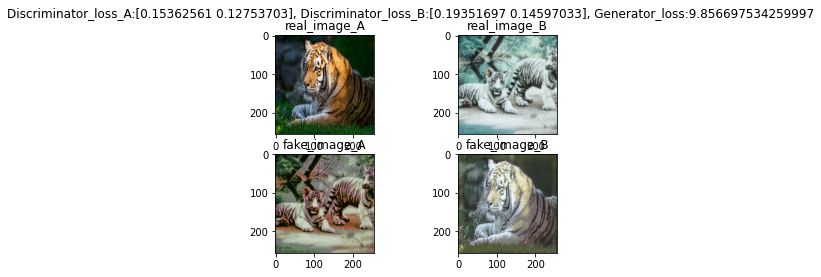

  3%|▎         | 1/30 [06:20<3:03:41, 380.05s/it]

gen_loss:6.654292244660227, disc_A_loss:[0.20872797 0.1731505 ], disc_B_loss:[0.22570432 0.18060564]
tensor([[0.4588],
        [0.2547],
        [0.3909]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3374],
        [0.1885],
        [0.5104]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.0005],
        [0.9760],
        [1.0212]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.7334],
        [0.3832],
        [0.8848]], device='cuda:0', grad_fn=<ViewBackward>)


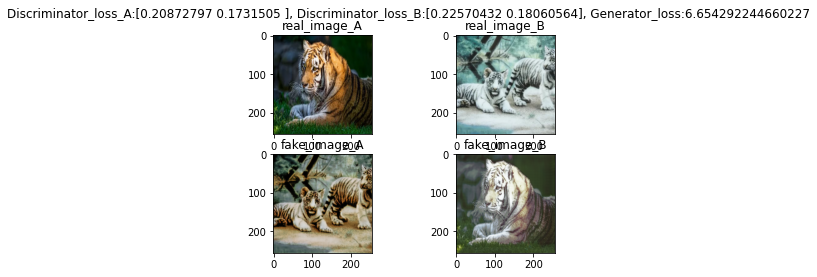

  7%|▋         | 2/30 [12:40<2:57:25, 380.21s/it]

gen_loss:6.034929329888863, disc_A_loss:[0.21530684 0.18323301], disc_B_loss:[0.2093432  0.17005538]
tensor([[0.6935],
        [1.0145],
        [1.0862]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4554],
        [0.5538],
        [0.4189]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5407],
        [0.6130],
        [0.7857]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1538],
        [0.3779],
        [0.2873]], device='cuda:0', grad_fn=<ViewBackward>)


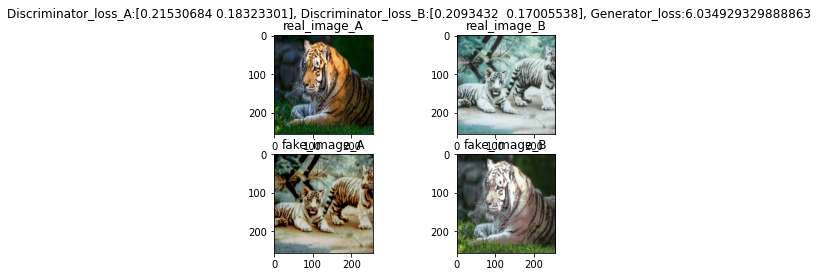

 10%|█         | 3/30 [19:04<2:51:31, 381.18s/it]

gen_loss:5.570870764422835, disc_A_loss:[0.21398621 0.17780498], disc_B_loss:[0.21871282 0.19247807]
tensor([[0.2356],
        [0.2956],
        [0.4613]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2860],
        [0.0692],
        [0.2709]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6389],
        [0.8089],
        [0.7906]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6086],
        [0.6360],
        [0.5867]], device='cuda:0', grad_fn=<ViewBackward>)


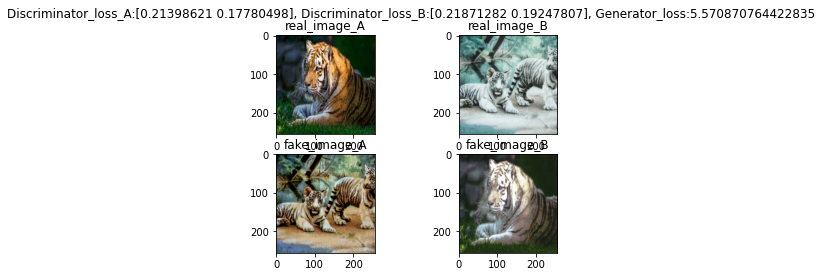

 13%|█▎        | 4/30 [25:33<2:46:12, 383.57s/it]

gen_loss:5.361528117405741, disc_A_loss:[0.21037668 0.18321707], disc_B_loss:[0.21431139 0.182274  ]
tensor([[0.7859],
        [0.8974],
        [1.0917]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.7019],
        [0.7796],
        [0.5767]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5361],
        [0.1700],
        [0.7932]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2856],
        [0.2196],
        [0.3164]], device='cuda:0', grad_fn=<ViewBackward>)


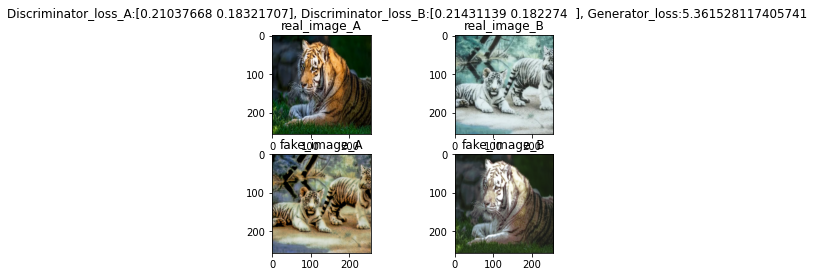

 17%|█▋        | 5/30 [32:02<2:40:29, 385.18s/it]

gen_loss:5.061325392179322, disc_A_loss:[0.20360215 0.17286886], disc_B_loss:[0.21532434 0.19507873]
tensor([[0.3616],
        [0.5612],
        [0.4417]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4306],
        [0.4213],
        [0.1254]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.3914],
        [0.2247],
        [0.7856]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4604],
        [0.3528],
        [0.2330]], device='cuda:0', grad_fn=<ViewBackward>)


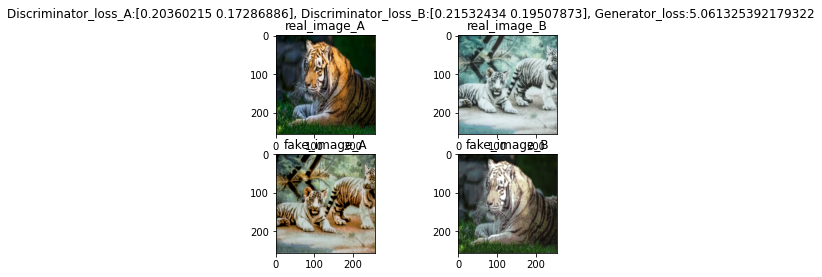

 20%|██        | 6/30 [38:29<2:34:19, 385.82s/it]

gen_loss:4.971185432191481, disc_A_loss:[0.20860769 0.1724885 ], disc_B_loss:[0.21571629 0.19550035]
tensor([[0.6597],
        [0.3422],
        [0.6985]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4191],
        [0.4430],
        [0.3648]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5920],
        [1.0803],
        [1.0444]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4713],
        [0.6436],
        [0.1717]], device='cuda:0', grad_fn=<ViewBackward>)


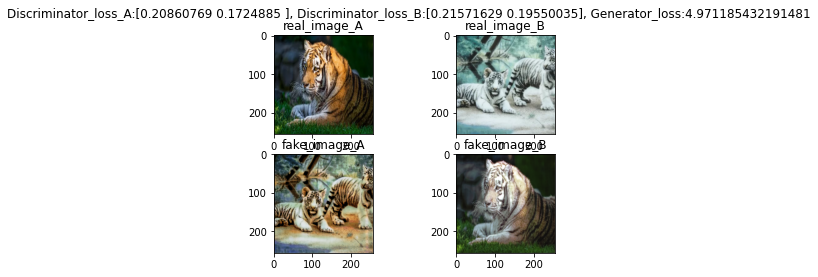

 23%|██▎       | 7/30 [44:56<2:28:04, 386.29s/it]

gen_loss:4.820479627241168, disc_A_loss:[0.21219846 0.18328635], disc_B_loss:[0.20784001 0.19699508]
tensor([[0.6807],
        [0.2472],
        [0.2794]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3006],
        [0.6409],
        [0.5111]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6968],
        [0.0210],
        [0.1827]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2760],
        [0.2283],
        [0.1754]], device='cuda:0', grad_fn=<ViewBackward>)


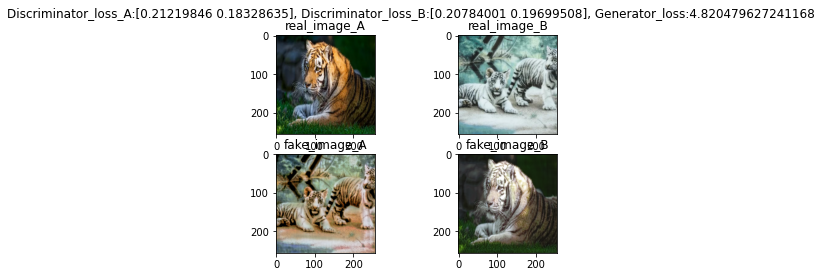

 27%|██▋       | 8/30 [51:24<2:21:45, 386.59s/it]

gen_loss:4.698685420186896, disc_A_loss:[0.210653   0.17614188], disc_B_loss:[0.20918681 0.19214492]
tensor([[0.9008],
        [0.5807],
        [1.1826]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5697],
        [0.3714],
        [0.3807]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5740],
        [0.6002],
        [0.4504]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2058],
        [0.0935],
        [0.2762]], device='cuda:0', grad_fn=<ViewBackward>)


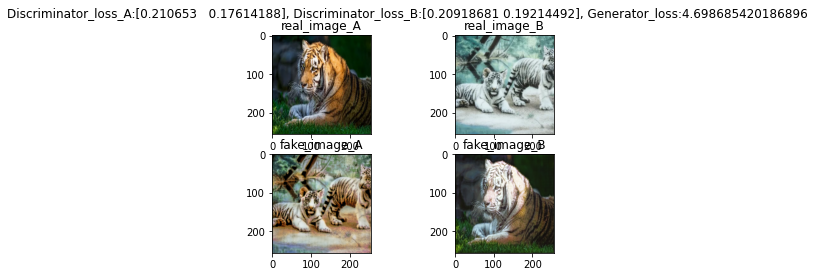

 30%|███       | 9/30 [57:51<2:15:24, 386.88s/it]

gen_loss:4.6753836284603985, disc_A_loss:[0.22063734 0.18073662], disc_B_loss:[0.21062828 0.19932653]
tensor([[0.2452],
        [0.6234],
        [0.5188]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2526],
        [0.2404],
        [0.0682]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.4016],
        [0.2387],
        [0.6264]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0039],
        [0.2972],
        [0.0534]], device='cuda:0', grad_fn=<ViewBackward>)


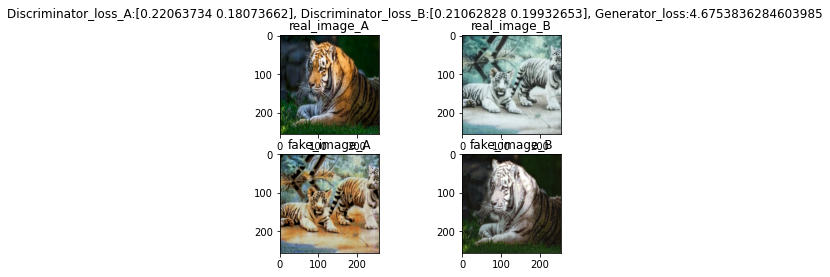

 33%|███▎      | 10/30 [1:04:19<2:09:01, 387.10s/it]

gen_loss:4.65995246694799, disc_A_loss:[0.1936063  0.16448647], disc_B_loss:[0.20721625 0.18256119]
tensor([[0.4473],
        [0.0721],
        [0.4011]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1938],
        [0.2722],
        [0.0954]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.4282],
        [0.8711],
        [0.7312]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3530],
        [0.7279],
        [0.2188]], device='cuda:0', grad_fn=<ViewBackward>)


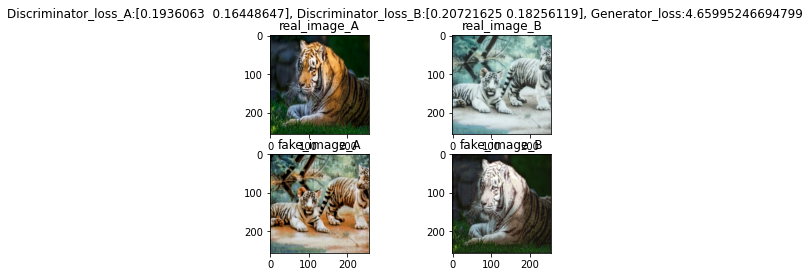

 37%|███▋      | 11/30 [1:10:47<2:02:39, 387.33s/it]

gen_loss:4.58086311398891, disc_A_loss:[0.20706275 0.16967689], disc_B_loss:[0.199985   0.18752071]
tensor([[1.0514],
        [0.3644],
        [0.4066]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6233],
        [0.4530],
        [0.5264]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7311],
        [0.8711],
        [0.5540]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3464],
        [0.3259],
        [0.3949]], device='cuda:0', grad_fn=<ViewBackward>)


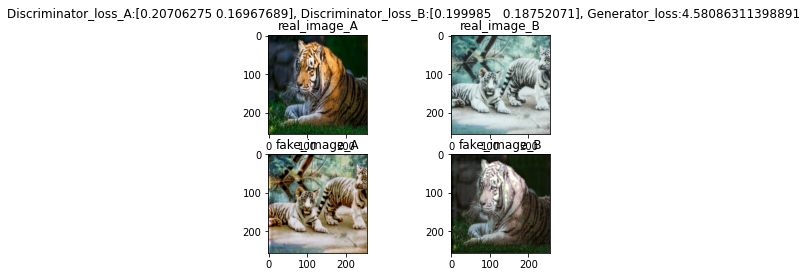

 40%|████      | 12/30 [1:17:14<1:56:12, 387.39s/it]

gen_loss:4.558252058531108, disc_A_loss:[0.20205927 0.16186747], disc_B_loss:[0.18790687 0.17217633]
tensor([[0.4904],
        [0.6397],
        [0.8984]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.7427],
        [0.4087],
        [0.6390]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5339],
        [0.4246],
        [0.7844]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.8073],
        [0.2176],
        [0.1733]], device='cuda:0', grad_fn=<ViewBackward>)


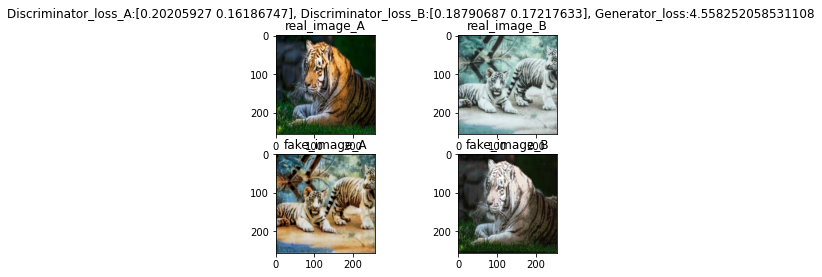

 43%|████▎     | 13/30 [1:23:42<1:49:46, 387.42s/it]

gen_loss:4.53112531858578, disc_A_loss:[0.18752288 0.14106127], disc_B_loss:[0.19706762 0.16904763]
tensor([[0.8025],
        [0.7666],
        [1.1547]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1999],
        [0.5658],
        [0.6295]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6911],
        [0.7153],
        [0.5596]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.5452],
        [ 0.3102],
        [-0.0273]], device='cuda:0', grad_fn=<ViewBackward>)


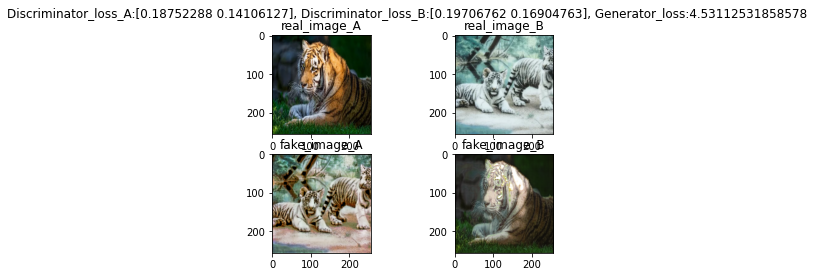

 47%|████▋     | 14/30 [1:30:10<1:43:21, 387.59s/it]

gen_loss:4.450542879732032, disc_A_loss:[0.19688043 0.16204884], disc_B_loss:[0.18710712 0.17188031]
tensor([[0.6047],
        [0.4212],
        [0.1999]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1734],
        [0.1984],
        [0.2085]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.2008],
        [1.1644],
        [0.3287]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[-0.0159],
        [ 0.3058],
        [ 0.1822]], device='cuda:0', grad_fn=<ViewBackward>)


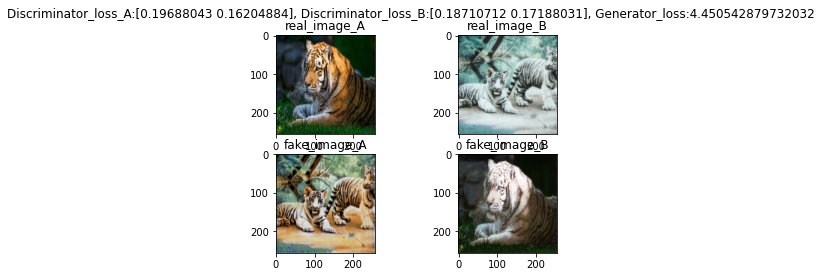

 50%|█████     | 15/30 [1:36:38<1:36:55, 387.68s/it]

gen_loss:4.452256463075939, disc_A_loss:[0.19917632 0.16024138], disc_B_loss:[0.18512881 0.17822737]
tensor([[0.6159],
        [0.5965],
        [0.5958]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.3809],
        [-0.0627],
        [ 0.0715]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7636],
        [0.7976],
        [1.0176]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4309],
        [0.3039],
        [0.2465]], device='cuda:0', grad_fn=<ViewBackward>)


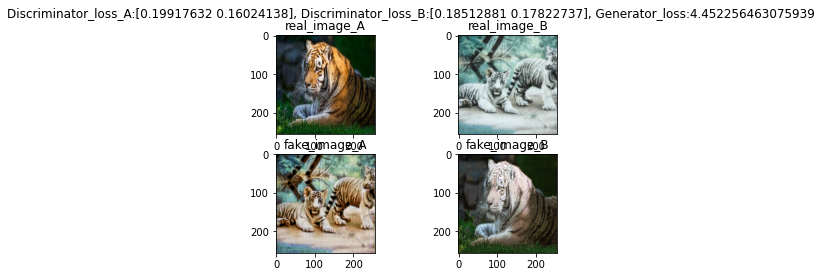

 53%|█████▎    | 16/30 [1:43:05<1:30:26, 387.63s/it]

gen_loss:4.529949196597986, disc_A_loss:[0.18275484 0.1451705 ], disc_B_loss:[0.18225271 0.16009681]
tensor([[0.6270],
        [0.8667],
        [0.8347]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4644],
        [0.4376],
        [0.7776]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.4902],
        [0.7265],
        [0.2098]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2216],
        [0.8406],
        [0.4192]], device='cuda:0', grad_fn=<ViewBackward>)


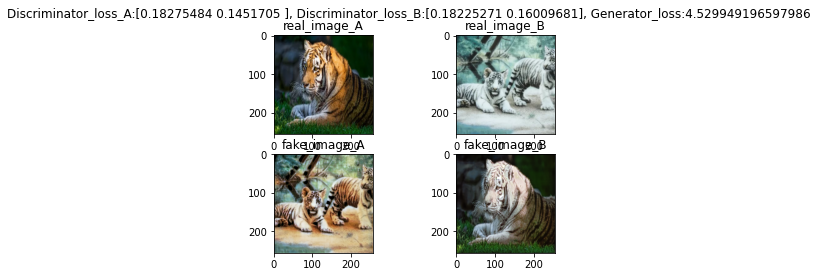

 57%|█████▋    | 17/30 [1:49:33<1:23:58, 387.58s/it]

gen_loss:4.41254699021055, disc_A_loss:[0.18464419 0.14566746], disc_B_loss:[0.18035641 0.16623288]
tensor([[0.7913],
        [0.9823],
        [0.9292]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[-0.1123],
        [ 0.2605],
        [ 0.3140]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8435],
        [0.5519],
        [0.6384]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[-0.1192],
        [ 0.3096],
        [ 0.2020]], device='cuda:0', grad_fn=<ViewBackward>)


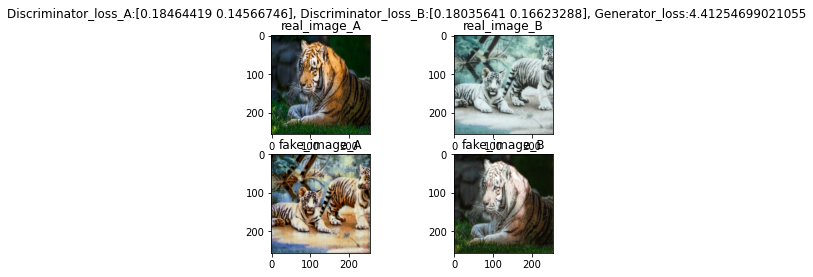

 60%|██████    | 18/30 [1:56:00<1:17:30, 387.50s/it]

gen_loss:4.499524489829414, disc_A_loss:[0.19454236 0.15614962], disc_B_loss:[0.18523182 0.15610632]
tensor([[0.2645],
        [0.6686],
        [0.3896]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5359],
        [0.1957],
        [0.3019]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8711],
        [0.6534],
        [0.7825]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0213],
        [0.0192],
        [0.6882]], device='cuda:0', grad_fn=<ViewBackward>)


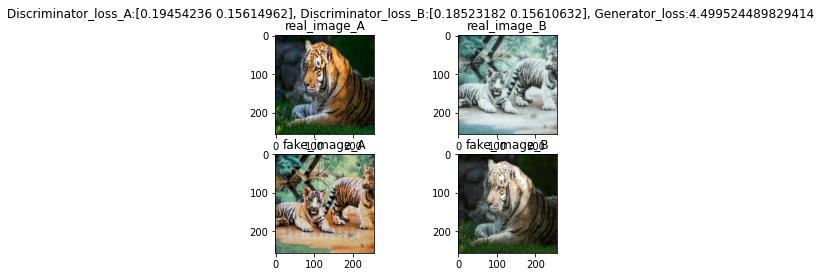

 63%|██████▎   | 19/30 [2:02:27<1:11:01, 387.45s/it]

gen_loss:4.448343335536489, disc_A_loss:[0.17055263 0.1314052 ], disc_B_loss:[0.18457703 0.16396591]
tensor([[0.9357],
        [1.1591],
        [0.4290]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6676],
        [0.6389],
        [0.6328]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6452],
        [0.5013],
        [0.4895]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4533],
        [0.3129],
        [0.3627]], device='cuda:0', grad_fn=<ViewBackward>)


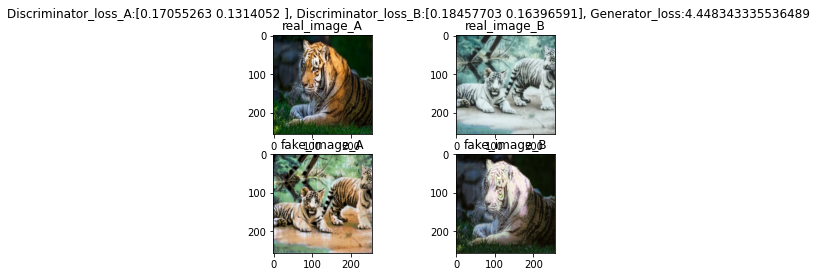

 67%|██████▋   | 20/30 [2:08:55<1:04:34, 387.48s/it]

gen_loss:4.336713007667608, disc_A_loss:[0.19025686 0.15508618], disc_B_loss:[0.18148635 0.15918418]
tensor([[1.0281],
        [0.7467],
        [0.3200]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5240],
        [0.5124],
        [0.7517]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7140],
        [0.8396],
        [0.8274]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3519],
        [0.5246],
        [0.2539]], device='cuda:0', grad_fn=<ViewBackward>)


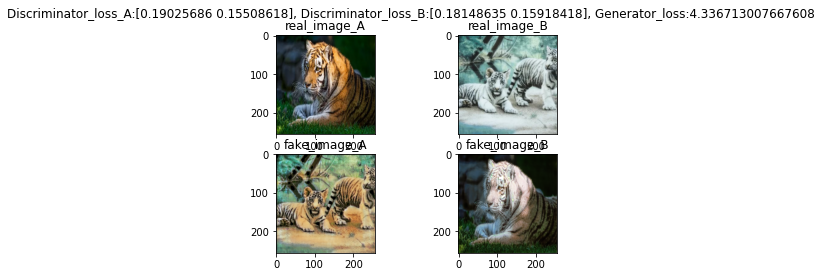

 70%|███████   | 21/30 [2:15:22<58:07, 387.55s/it]  

gen_loss:4.30566769629194, disc_A_loss:[0.19856752 0.16259376], disc_B_loss:[0.15736941 0.14308956]
tensor([[0.5665],
        [1.0632],
        [1.0109]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3523],
        [0.4369],
        [0.4680]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8038],
        [0.6573],
        [0.9196]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4467],
        [0.3355],
        [0.6009]], device='cuda:0', grad_fn=<ViewBackward>)


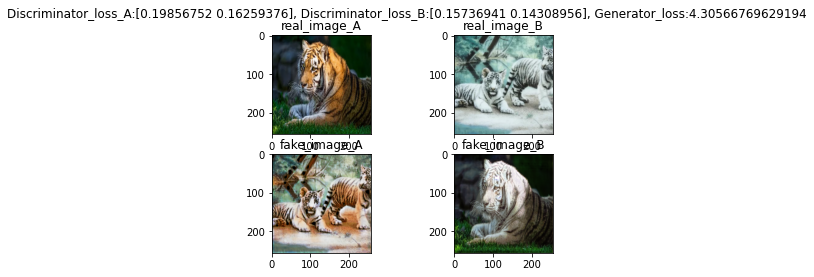

 73%|███████▎  | 22/30 [2:21:50<51:40, 387.53s/it]

gen_loss:4.325399100780487, disc_A_loss:[0.17696673 0.14669018], disc_B_loss:[0.17581649 0.15220208]
tensor([[1.0081],
        [1.3250],
        [0.9439]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4149],
        [0.8927],
        [0.4958]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6880],
        [0.7316],
        [0.7275]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3845],
        [0.2549],
        [0.2361]], device='cuda:0', grad_fn=<ViewBackward>)


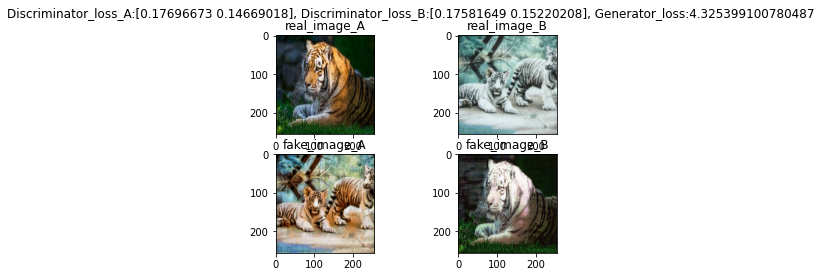

 77%|███████▋  | 23/30 [2:28:22<45:22, 388.90s/it]

gen_loss:4.423056145509084, disc_A_loss:[0.18708123 0.14666309], disc_B_loss:[0.17904481 0.15729586]
tensor([[1.2949],
        [0.7284],
        [0.8271]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4174],
        [0.6503],
        [0.4610]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.1887],
        [0.3281],
        [0.3442]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.6190],
        [-0.0287],
        [-0.0491]], device='cuda:0', grad_fn=<ViewBackward>)


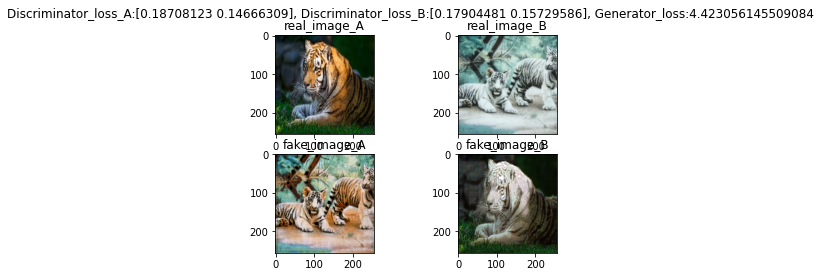

 80%|████████  | 24/30 [2:34:54<38:58, 389.81s/it]

gen_loss:4.294031726686578, disc_A_loss:[0.17693968 0.1423956 ], disc_B_loss:[0.16760991 0.14449239]
tensor([[0.3410],
        [0.7630],
        [0.4976]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1784],
        [0.4042],
        [0.3586]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5669],
        [1.0425],
        [0.6299]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6887],
        [0.5647],
        [0.4254]], device='cuda:0', grad_fn=<ViewBackward>)


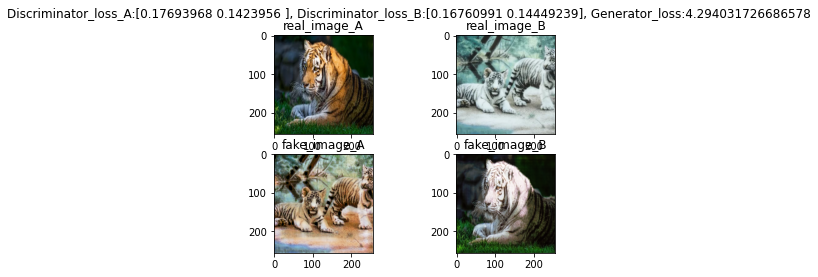

 83%|████████▎ | 25/30 [2:41:26<32:32, 390.55s/it]

gen_loss:4.382186853049094, disc_A_loss:[0.17962228 0.14274038], disc_B_loss:[0.15391568 0.13584086]
tensor([[0.3361],
        [0.7004],
        [0.5903]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6579],
        [0.0878],
        [0.2413]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6074],
        [1.1858],
        [0.5059]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.6990],
        [0.0871],
        [0.3101]], device='cuda:0', grad_fn=<ViewBackward>)


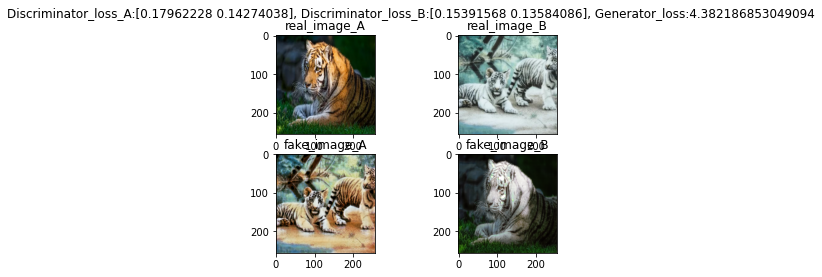

 87%|████████▋ | 26/30 [2:47:59<26:04, 391.14s/it]

gen_loss:4.357330297168932, disc_A_loss:[0.17176485 0.13799247], disc_B_loss:[0.16245513 0.1384599 ]
tensor([[-0.1694],
        [ 0.6302],
        [ 0.8298]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2588],
        [0.7212],
        [0.1693]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.0084],
        [0.4320],
        [0.4863]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.5771],
        [ 0.2933],
        [-0.0974]], device='cuda:0', grad_fn=<ViewBackward>)


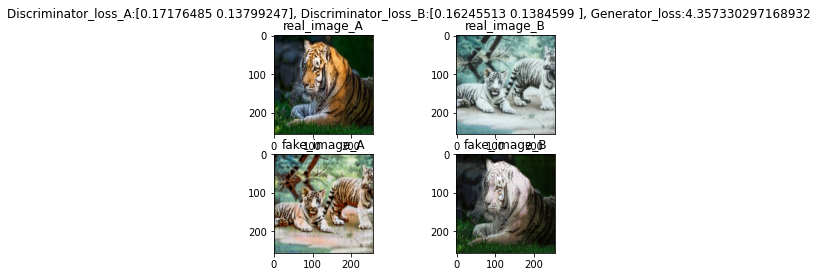

 90%|█████████ | 27/30 [2:54:31<19:34, 391.40s/it]

gen_loss:4.329064382795702, disc_A_loss:[0.2011732  0.17338236], disc_B_loss:[0.16018331 0.14692353]
tensor([[0.7031],
        [0.5254],
        [0.8465]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4436],
        [0.2995],
        [0.4159]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9454],
        [0.4381],
        [0.1689]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5546],
        [0.3971],
        [0.1452]], device='cuda:0', grad_fn=<ViewBackward>)


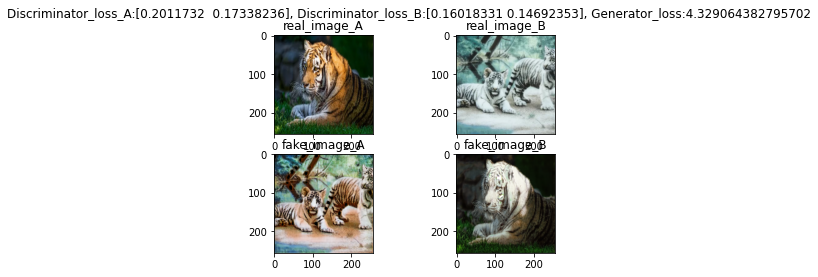

 93%|█████████▎| 28/30 [3:01:02<13:02, 391.43s/it]

gen_loss:4.342562197593221, disc_A_loss:[0.17569014 0.13926762], disc_B_loss:[0.16535636 0.14645449]
tensor([[1.0830],
        [0.7091],
        [1.1967]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3197],
        [0.5715],
        [0.6340]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5344],
        [0.5895],
        [0.7836]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0879],
        [0.0596],
        [0.0462]], device='cuda:0', grad_fn=<ViewBackward>)


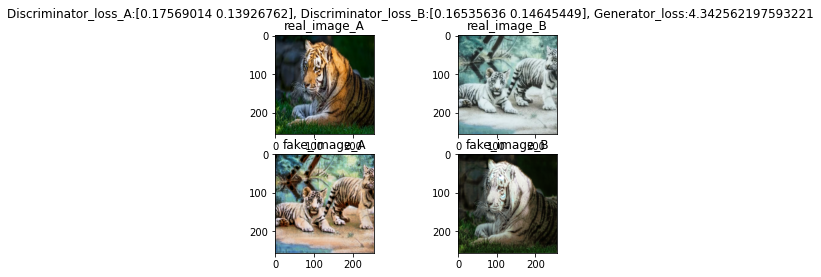

 97%|█████████▋| 29/30 [3:07:34<06:31, 391.50s/it]

gen_loss:4.314758697099853, disc_A_loss:[0.16491012 0.13355814], disc_B_loss:[0.15406201 0.12718769]
tensor([[0.8600],
        [1.4066],
        [1.0376]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4912],
        [0.2895],
        [0.5089]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6158],
        [0.7079],
        [0.7126]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2331],
        [0.3997],
        [0.3304]], device='cuda:0', grad_fn=<ViewBackward>)


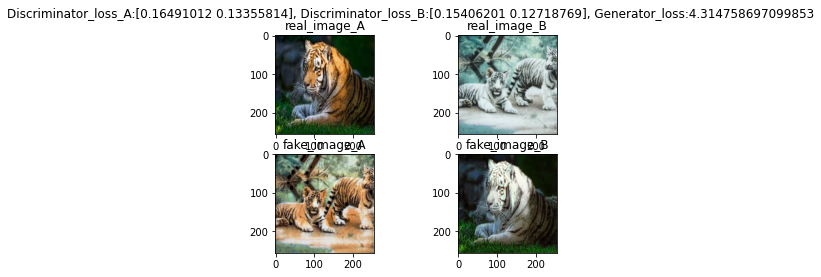

100%|██████████| 30/30 [3:14:05<00:00, 388.19s/it]


In [0]:
train(netD_A, netD_B, netG_A2B, netG_B2A, 0.0002, 30, 13)

In [0]:
load_parameters(13)

  0%|          | 0/10 [00:00<?, ?it/s]

gen_loss:4.0556527309087445, disc_A_loss:[0.1429323  0.08798327], disc_B_loss:[0.14087445 0.10331174]
tensor([[0.5633],
        [0.3704],
        [0.1702]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.4872],
        [-0.0656],
        [ 0.4819]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.3520],
        [0.9560],
        [0.4621]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0737],
        [0.1377],
        [0.3121]], device='cuda:0', grad_fn=<ViewBackward>)


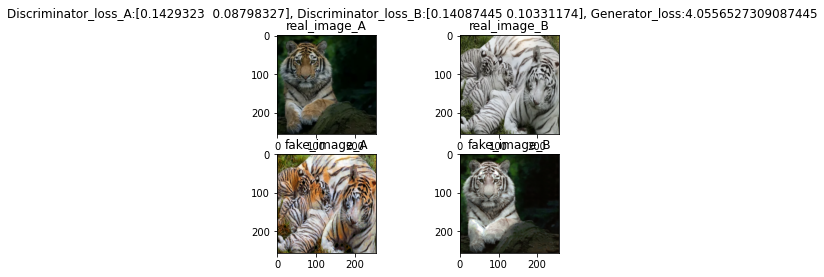

 10%|█         | 1/10 [01:27<13:06, 87.42s/it]

gen_loss:4.051420308810808, disc_A_loss:[0.13393339 0.0854775 ], disc_B_loss:[0.13741906 0.09821406]
tensor([[0.7986],
        [0.8859],
        [0.7413]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1889],
        [0.1304],
        [0.4481]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7741],
        [0.8818],
        [0.2722]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4666],
        [0.3109],
        [0.5024]], device='cuda:0', grad_fn=<ViewBackward>)


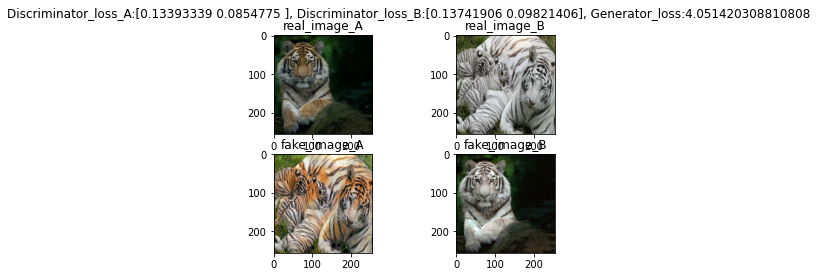

 20%|██        | 2/10 [02:54<11:38, 87.33s/it]

gen_loss:4.062867374131174, disc_A_loss:[0.13290727 0.08613166], disc_B_loss:[0.12699775 0.09564579]
tensor([[0.7860],
        [0.0792],
        [0.8672]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0398],
        [0.1454],
        [0.0251]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5395],
        [0.5901],
        [0.4888]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3565],
        [0.4515],
        [0.4497]], device='cuda:0', grad_fn=<ViewBackward>)


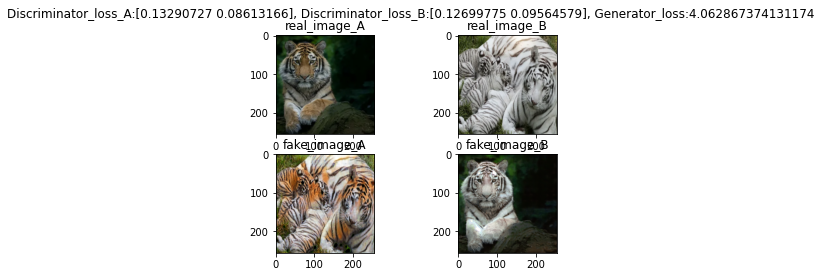

 30%|███       | 3/10 [04:21<10:10, 87.23s/it]

gen_loss:4.057854619377103, disc_A_loss:[0.13067914 0.08204843], disc_B_loss:[0.12793553 0.0967714 ]
tensor([[0.5470],
        [0.6760],
        [0.5746]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.4637],
        [ 0.0225],
        [-0.0250]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5018],
        [0.9447],
        [1.4186]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1916],
        [0.3606],
        [0.2916]], device='cuda:0', grad_fn=<ViewBackward>)


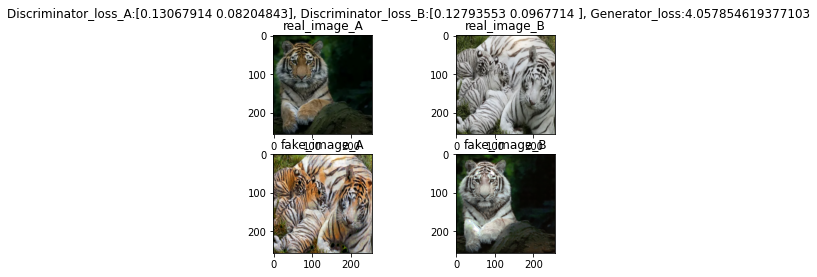

 40%|████      | 4/10 [05:48<08:43, 87.19s/it]

gen_loss:4.06257219644852, disc_A_loss:[0.13187427 0.08257892], disc_B_loss:[0.12619501 0.09257676]
tensor([[1.0525],
        [0.5126],
        [0.8359]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[ 0.1537],
        [ 0.0293],
        [-0.0321]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6591],
        [0.9314],
        [0.9370]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1954],
        [0.0812],
        [0.0480]], device='cuda:0', grad_fn=<ViewBackward>)


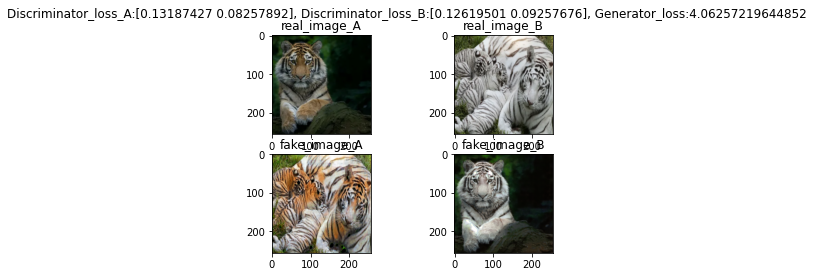

 50%|█████     | 5/10 [07:15<07:15, 87.17s/it]

gen_loss:4.064817425492522, disc_A_loss:[0.13216345 0.08172035], disc_B_loss:[0.12198127 0.09255255]
tensor([[0.5878],
        [0.4683],
        [0.6102]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1496],
        [0.3198],
        [0.3810]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9960],
        [0.5092],
        [0.8805]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3937],
        [0.3014],
        [0.0594]], device='cuda:0', grad_fn=<ViewBackward>)


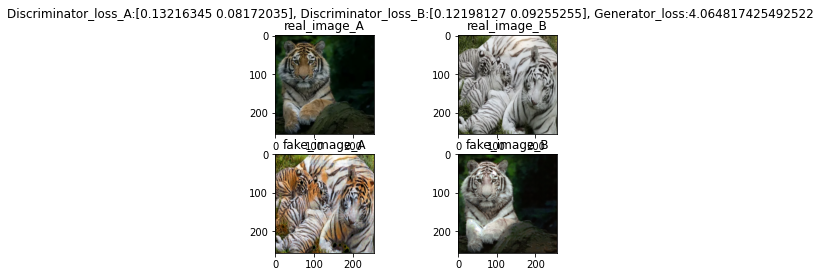

 60%|██████    | 6/10 [08:42<05:48, 87.17s/it]

gen_loss:4.081001022677401, disc_A_loss:[0.12556968 0.0788252 ], disc_B_loss:[0.120457   0.09152705]
tensor([[0.9803],
        [0.3837],
        [0.7586]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1256],
        [0.3721],
        [0.4662]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.4876],
        [0.8667],
        [0.5898]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2379],
        [0.2509],
        [0.2591]], device='cuda:0', grad_fn=<ViewBackward>)


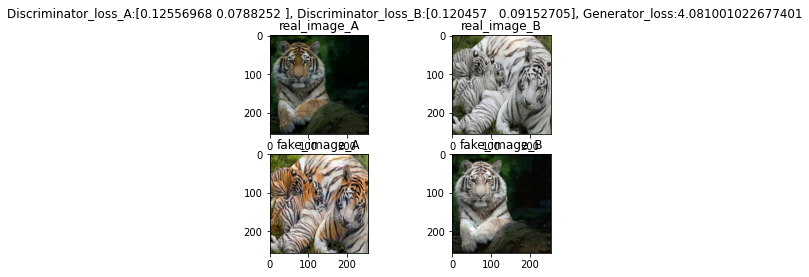

 70%|███████   | 7/10 [10:09<04:21, 87.14s/it]

gen_loss:4.071156487320408, disc_A_loss:[0.12680435 0.08282108], disc_B_loss:[0.11627693 0.08812573]
tensor([[0.5815],
        [0.8962],
        [0.6111]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1223],
        [0.3503],
        [0.2577]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7232],
        [0.9569],
        [1.2650]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3215],
        [0.1711],
        [0.0535]], device='cuda:0', grad_fn=<ViewBackward>)


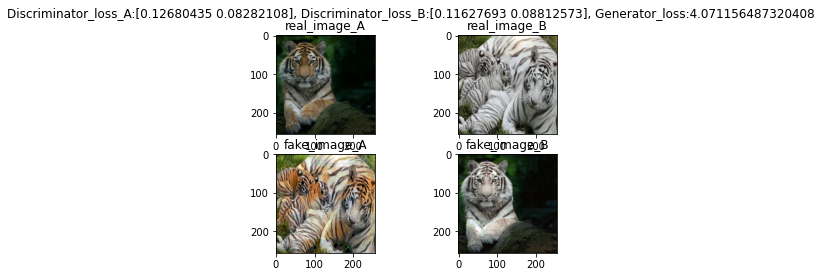

 80%|████████  | 8/10 [11:37<02:54, 87.12s/it]

gen_loss:4.091033022125046, disc_A_loss:[0.12074407 0.08154822], disc_B_loss:[0.11740969 0.08432831]
tensor([[0.9124],
        [0.4196],
        [0.9127]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4601],
        [0.2451],
        [0.2681]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8651],
        [0.9357],
        [0.6370]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2534],
        [0.3285],
        [0.1046]], device='cuda:0', grad_fn=<ViewBackward>)


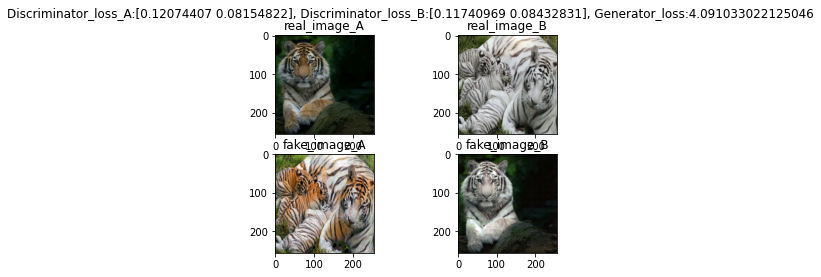

 90%|█████████ | 9/10 [13:04<01:27, 87.11s/it]

gen_loss:4.096697746417223, disc_A_loss:[0.1239389  0.07667986], disc_B_loss:[0.11244102 0.08229365]
tensor([[1.2798],
        [0.7110],
        [0.4929]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1330],
        [0.3349],
        [0.2882]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6817],
        [0.7699],
        [1.0326]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3114],
        [0.3040],
        [0.3092]], device='cuda:0', grad_fn=<ViewBackward>)


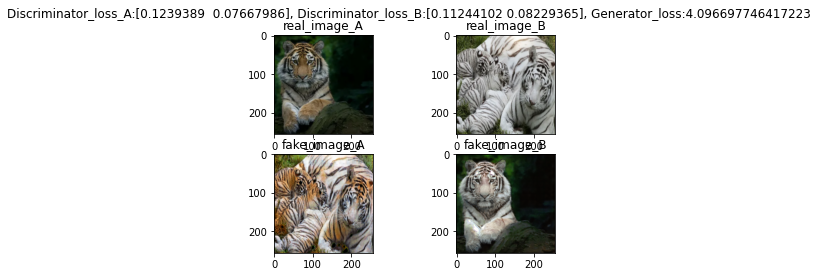

100%|██████████| 10/10 [14:31<00:00, 87.12s/it]


In [0]:
train(netD_A, netD_B, netG_A2B, netG_B2A, 0.00002, 10, 15)

In [0]:
load_parameters(15)

  0%|          | 0/10 [00:00<?, ?it/s]

gen_loss:4.0630470030172425, disc_A_loss:[0.11524459 0.0720541 ], disc_B_loss:[0.11908832 0.0829669 ]
tensor([[0.5456],
        [0.7616]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5192],
        [0.2238]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6266],
        [0.6879]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4105],
        [0.1988]], device='cuda:0', grad_fn=<ViewBackward>)


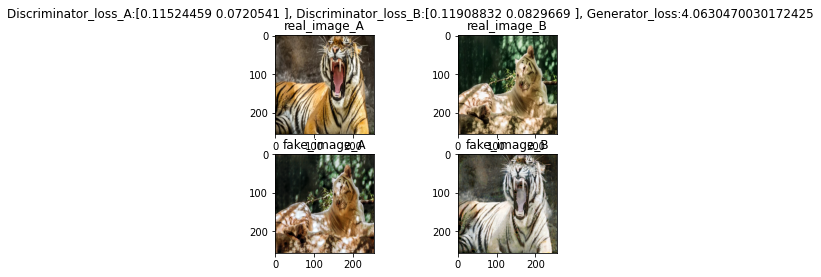

 10%|█         | 1/10 [02:42<24:18, 162.06s/it]

gen_loss:4.051612541665157, disc_A_loss:[0.11402285 0.06881537], disc_B_loss:[0.11706321 0.08533025]
tensor([[1.0022],
        [0.3745]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0798],
        [0.2592]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9290],
        [0.2683]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4185],
        [0.2786]], device='cuda:0', grad_fn=<ViewBackward>)


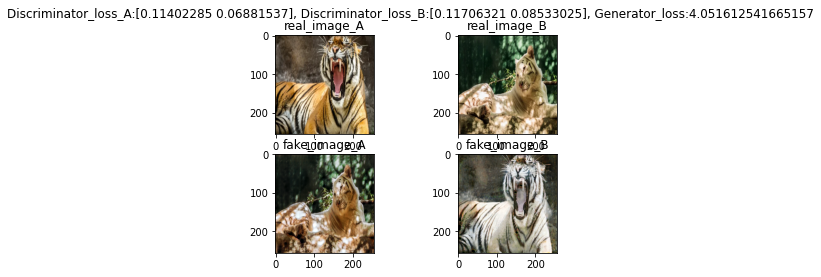

 20%|██        | 2/10 [05:24<21:36, 162.10s/it]

gen_loss:4.04964010371912, disc_A_loss:[0.1165554  0.07206517], disc_B_loss:[0.11803143 0.08471311]
tensor([[0.8317],
        [0.8728]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2995],
        [0.2108]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7909],
        [0.7709]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2172],
        [0.2007]], device='cuda:0', grad_fn=<ViewBackward>)


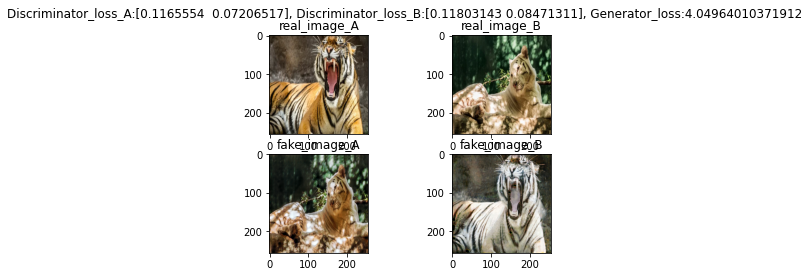

 30%|███       | 3/10 [08:06<18:55, 162.21s/it]

gen_loss:4.0478139319274105, disc_A_loss:[0.11959061 0.07393316], disc_B_loss:[0.12100324 0.08413366]
tensor([[0.8407],
        [0.7491]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1351],
        [0.1114]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5351],
        [0.5601]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2977],
        [0.0892]], device='cuda:0', grad_fn=<ViewBackward>)


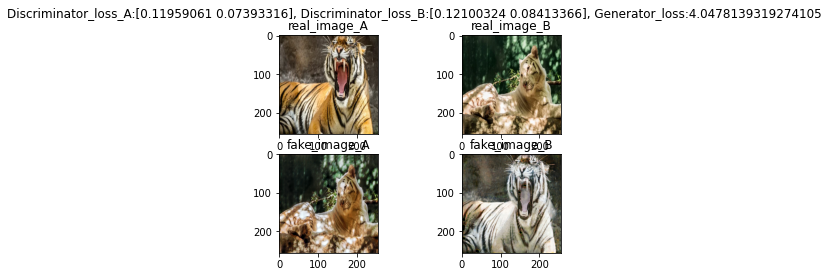

 40%|████      | 4/10 [10:49<16:13, 162.28s/it]

gen_loss:4.043396203278454, disc_A_loss:[0.12051272 0.07633621], disc_B_loss:[0.11636132 0.08573296]
tensor([[0.7595],
        [0.9560]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1857],
        [0.2509]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.7350],
        [0.5237]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4445],
        [0.0463]], device='cuda:0', grad_fn=<ViewBackward>)


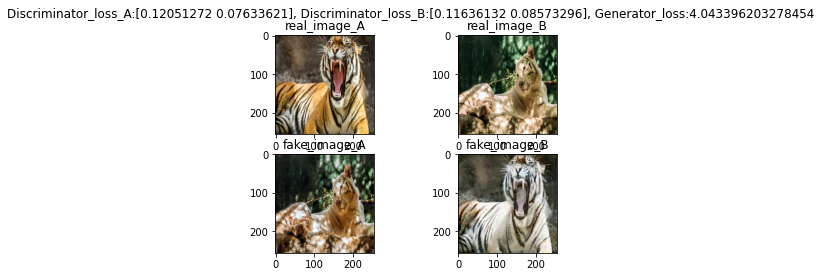

 50%|█████     | 5/10 [13:31<13:31, 162.21s/it]

gen_loss:4.0506436002306545, disc_A_loss:[0.11942517 0.07627602], disc_B_loss:[0.11644285 0.08272932]
tensor([[0.6928],
        [0.9449]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3657],
        [0.3231]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.0211],
        [0.9438]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1783],
        [0.2943]], device='cuda:0', grad_fn=<ViewBackward>)


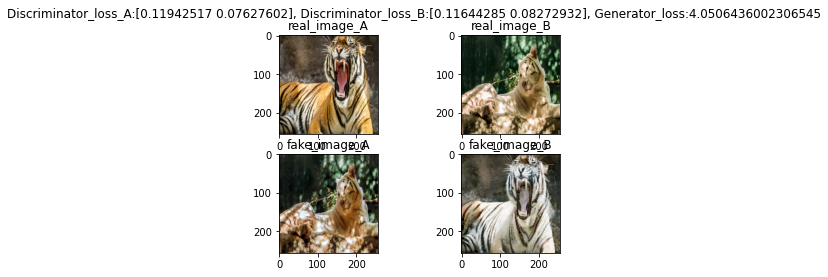

 60%|██████    | 6/10 [16:13<10:49, 162.26s/it]

gen_loss:4.055140731636614, disc_A_loss:[0.12039913 0.07384764], disc_B_loss:[0.11343523 0.08285278]
tensor([[0.4140],
        [0.9206]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3318],
        [0.0790]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6573],
        [0.9577]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2404],
        [0.2060]], device='cuda:0', grad_fn=<ViewBackward>)


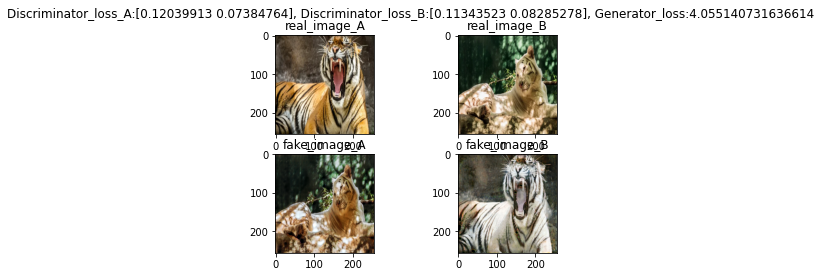

 70%|███████   | 7/10 [18:56<08:06, 162.33s/it]

gen_loss:4.056034229728332, disc_A_loss:[0.11898854 0.07449227], disc_B_loss:[0.11321334 0.08122933]
tensor([[0.2417],
        [0.9222]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3191],
        [0.2455]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.2001],
        [0.7064]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.5656],
        [0.3450]], device='cuda:0', grad_fn=<ViewBackward>)


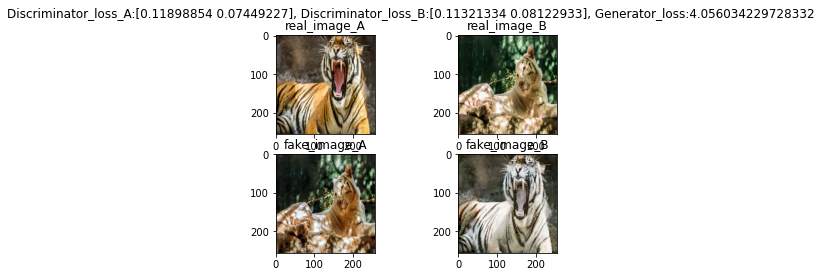

 80%|████████  | 8/10 [21:38<05:24, 162.35s/it]

gen_loss:4.053838000026853, disc_A_loss:[0.11794701 0.07300746], disc_B_loss:[0.11205009 0.08054808]
tensor([[0.6562],
        [0.3761]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1550],
        [0.2201]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9155],
        [0.8517]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1173],
        [0.3762]], device='cuda:0', grad_fn=<ViewBackward>)


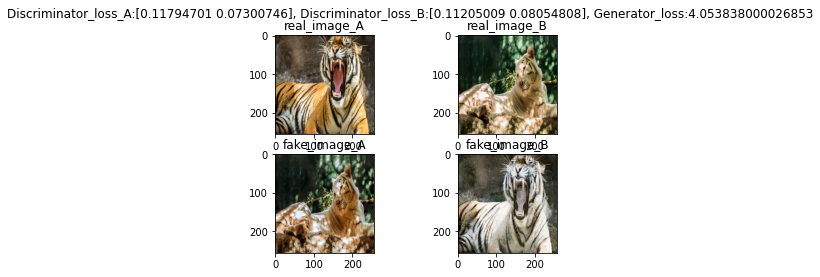

 90%|█████████ | 9/10 [24:20<02:42, 162.35s/it]

gen_loss:4.056520993012008, disc_A_loss:[0.11710271 0.07143695], disc_B_loss:[0.11195335 0.08116716]
tensor([[0.7681],
        [1.0352]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4677],
        [0.3340]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.0642],
        [1.1587]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3010],
        [0.1935]], device='cuda:0', grad_fn=<ViewBackward>)


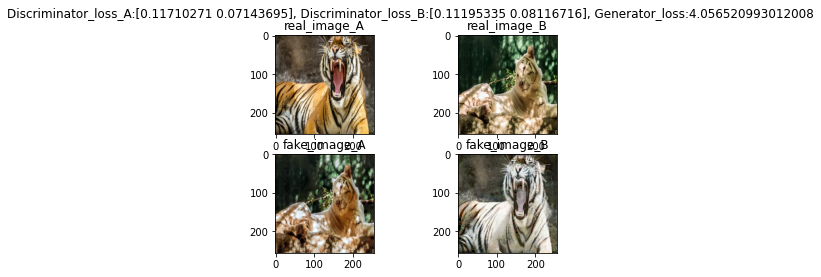

100%|██████████| 10/10 [27:03<00:00, 162.34s/it]


In [0]:
train(netD_A, netD_B, netG_A2B, netG_B2A, 0.000002, 10, 16)

In [0]:
load_parameters(16)




  0%|          | 0/10 [00:00<?, ?it/s]

gen_loss:4.058739938069639, disc_A_loss:[0.11650361 0.06984491], disc_B_loss:[0.11270567 0.07852383]
tensor([[1.0465],
        [0.4848]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0992],
        [0.2024]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8208],
        [0.4886]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2002],
        [0.1261]], device='cuda:0', grad_fn=<ViewBackward>)


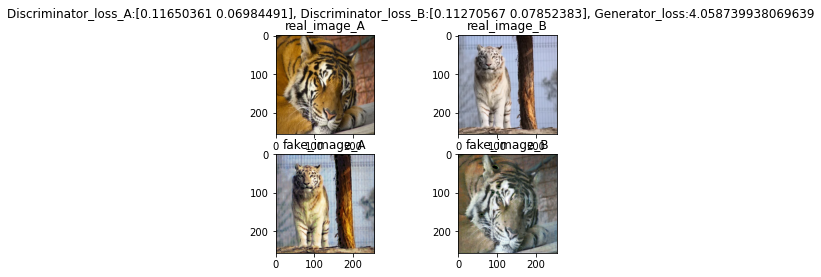




 10%|█         | 1/10 [02:42<24:20, 162.31s/it]

gen_loss:4.0453301340211425, disc_A_loss:[0.11404601 0.0715102 ], disc_B_loss:[0.1109693  0.08021143]
tensor([[0.5758],
        [0.4078]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2977],
        [0.3464]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[1.0640],
        [0.4720]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4824],
        [0.4105]], device='cuda:0', grad_fn=<ViewBackward>)


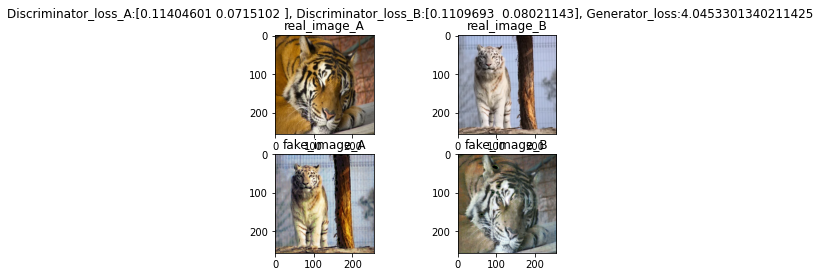




 20%|██        | 2/10 [05:24<21:37, 162.19s/it]

gen_loss:4.048958946003143, disc_A_loss:[0.11491249 0.07011334], disc_B_loss:[0.1098271  0.07988921]
tensor([[0.7078],
        [1.5251]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3120],
        [0.0168]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9601],
        [0.5947]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.0724],
        [0.3467]], device='cuda:0', grad_fn=<ViewBackward>)


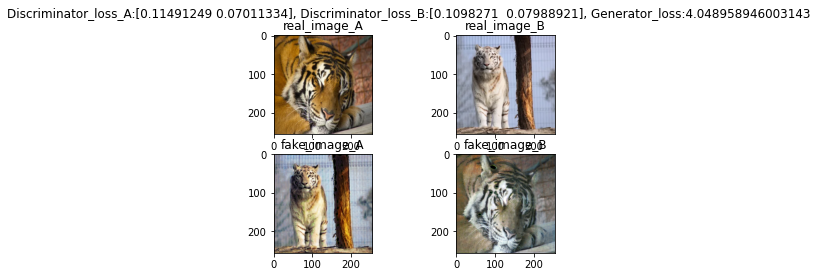




 30%|███       | 3/10 [08:06<18:55, 162.16s/it]

gen_loss:4.052043372366626, disc_A_loss:[0.11370157 0.07005012], disc_B_loss:[0.11171766 0.07865396]
tensor([[1.0304],
        [0.7031]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2584],
        [0.3416]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9389],
        [0.4437]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2510],
        [0.1622]], device='cuda:0', grad_fn=<ViewBackward>)


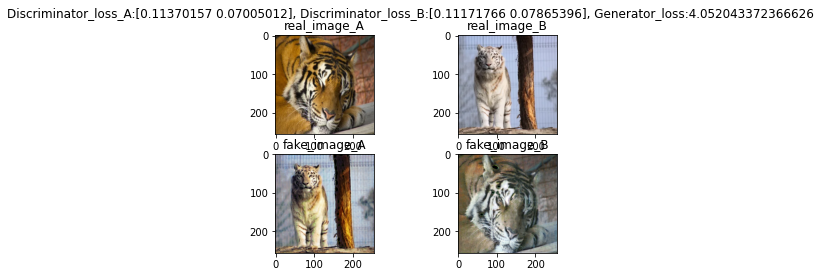




 40%|████      | 4/10 [10:48<16:13, 162.31s/it]

gen_loss:4.059020466159004, disc_A_loss:[0.11557941 0.06781794], disc_B_loss:[0.11182898 0.07769485]
tensor([[0.6460],
        [1.0898]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2458],
        [0.5500]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8406],
        [0.5302]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3010],
        [0.2746]], device='cuda:0', grad_fn=<ViewBackward>)


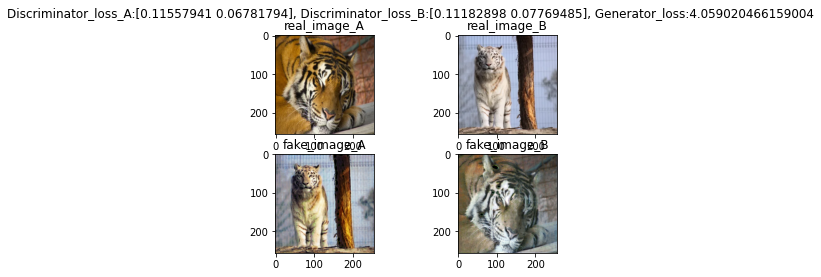




 50%|█████     | 5/10 [13:31<13:31, 162.24s/it]

gen_loss:4.042329624750729, disc_A_loss:[0.11292974 0.06998819], disc_B_loss:[0.10880794 0.08021679]
tensor([[0.7719],
        [0.5277]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1141],
        [0.3419]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.8699],
        [0.6601]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2816],
        [0.2777]], device='cuda:0', grad_fn=<ViewBackward>)


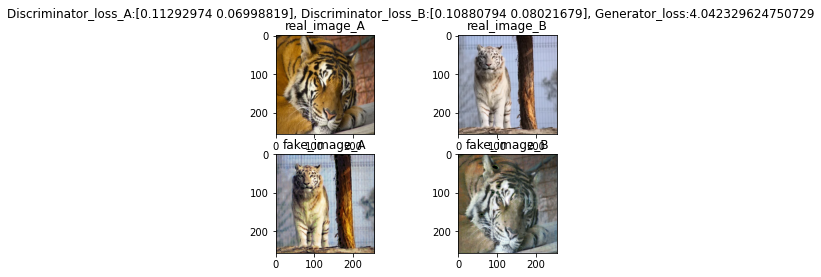




 60%|██████    | 6/10 [16:13<10:49, 162.32s/it]

gen_loss:4.047947069442949, disc_A_loss:[0.1136495  0.06946843], disc_B_loss:[0.1097253  0.07839322]
tensor([[0.4918],
        [0.7531]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.4339],
        [0.1739]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.6977],
        [0.7880]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3936],
        [0.3159]], device='cuda:0', grad_fn=<ViewBackward>)


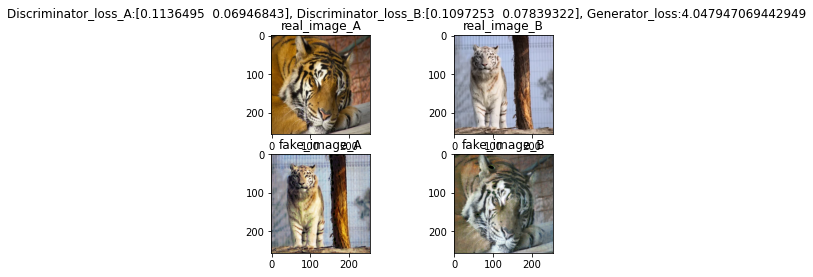




 70%|███████   | 7/10 [18:56<08:07, 162.39s/it]

gen_loss:4.050973455978793, disc_A_loss:[0.11391532 0.0689365 ], disc_B_loss:[0.10939351 0.07851364]
tensor([[0.6072],
        [0.9357]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2446],
        [0.1683]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.9487],
        [0.7990]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1671],
        [0.1879]], device='cuda:0', grad_fn=<ViewBackward>)


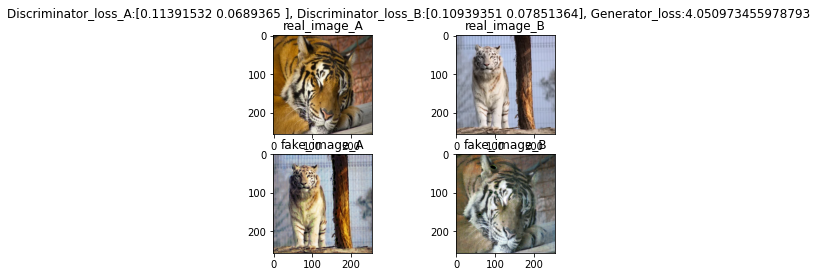




 80%|████████  | 8/10 [21:38<05:24, 162.35s/it]

gen_loss:4.0495679003703025, disc_A_loss:[0.11338595 0.06930866], disc_B_loss:[0.10955551 0.07738763]
tensor([[0.5124],
        [0.9806]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.3465],
        [0.2690]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5612],
        [1.0460]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2787],
        [0.2576]], device='cuda:0', grad_fn=<ViewBackward>)


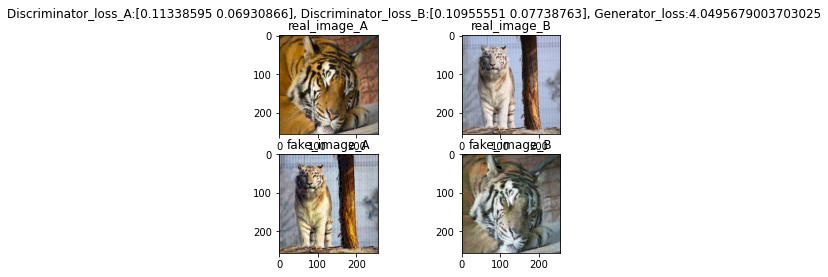




 90%|█████████ | 9/10 [24:20<02:42, 162.30s/it]

gen_loss:4.053608454991636, disc_A_loss:[0.11357103 0.06889718], disc_B_loss:[0.1085227  0.07831227]
tensor([[0.8716],
        [1.0023]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.1704],
        [0.4146]], device='cuda:0', grad_fn=<ViewBackward>)
tensor([[0.5663],
        [1.3040]], device='cuda:0', grad_fn=<ViewBackward>) tensor([[0.2492],
        [0.2948]], device='cuda:0', grad_fn=<ViewBackward>)


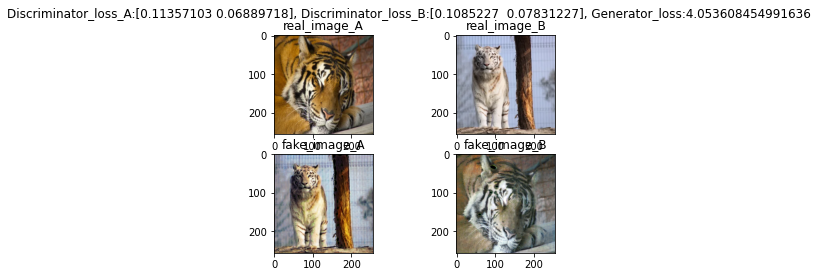




100%|██████████| 10/10 [27:02<00:00, 162.26s/it]


In [0]:
train(netD_A, netD_B, netG_A2B, netG_B2A, 0.000001, 10, 17)

In [0]:
load_parameters(17)

In [0]:
with open('drive/My Drive/model{}/loss.txt'.format(13), 'rb') as fl:
            loss_1 = pickle.load(fl)
with open('drive/My Drive/model{}/loss.txt'.format(15), 'rb') as fl:
            loss_2 = pickle.load(fl)
with open('drive/My Drive/model{}/loss.txt'.format(16), 'rb') as fl:
            loss_3 = pickle.load(fl)
with open('drive/My Drive/model{}/loss.txt'.format(17), 'rb') as fl:
            loss_4 = pickle.load(fl)

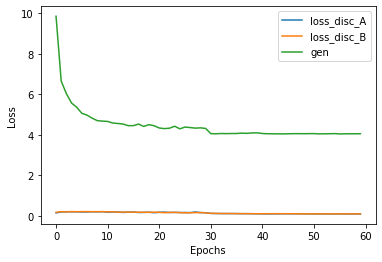

In [39]:
loss = {'disc_A':loss_1['disc_A'] + loss_2['disc_A']
        + loss_3['disc_A'] + loss_4['disc_A'],
        'disc_B':loss_1['disc_B'] + loss_2['disc_B']
        + loss_3['disc_B'] + loss_4['disc_B'],
        'gen':loss_1['gen'] + loss_2['gen']
        + loss_3['gen'] + loss_4['gen']}
for i in range(len(loss['disc_A'])):
    loss['disc_A'][i] = (loss['disc_A'][i][0] + loss['disc_A'][i][1]) / 2
for i in range(len(loss['disc_A'])):
    loss['disc_B'][i] = (loss['disc_B'][i][0] + loss['disc_B'][i][1]) / 2
fig, ax = plt.subplots()
ax.plot(range(len(loss['disc_A'])), loss['disc_A'], label = 'loss_disc_A')
ax.plot(range(len(loss['disc_B'])), loss['disc_B'], label = 'loss_disc_B')
ax.plot(range(len(loss['gen'])), loss['gen'], label = 'gen')
ax.legend()
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
plt.show()

In [0]:
def plot_result():
    a = next(iter(data_ts))[0].to(device)
    b = next(iter(data_ts))[1].to(device)
    plt.subplot(2, 3, 1)
    plt.imshow(np.rollaxis(np.array((a / 2 + 0.5).detach().cpu()[2]), 0, 3))
    plt.subplot(2, 3, 2)
    plt.imshow(np.rollaxis(np.array((netG_A2B(a) / 2 + 0.5).detach().cpu()[2]), 0, 3))
    plt.subplot(2, 3, 3)
    plt.imshow(np.rollaxis(np.array((netG_B2A(netG_A2B(a)) / 2 + 0.5).detach().cpu()[2]), 0, 3))
    plt.subplot(2, 3, 4)
    plt.imshow(np.rollaxis(np.array((b / 2 + 0.5 ).detach().cpu()[2]), 0, 3))
    plt.subplot(2, 3, 5)
    plt.imshow(np.rollaxis(np.array((netG_B2A(b) / 2 + 0.5).detach().cpu()[2]), 0, 3))
    plt.subplot(2, 3, 6)
    plt.imshow(np.rollaxis(np.array((netG_A2B(netG_B2A(b)) / 2 + 0.5).detach().cpu()[2]), 0, 3))
    plt.show()

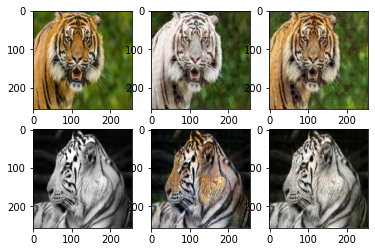

In [56]:
plot_result()

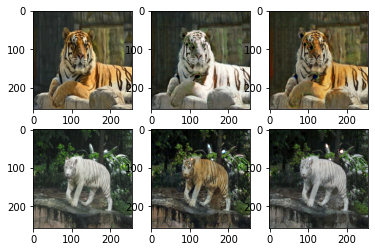

In [19]:
plot_result()

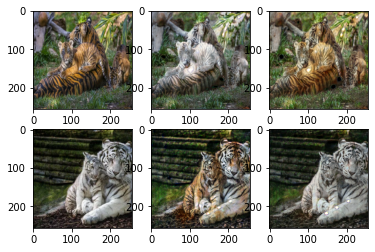

In [21]:
plot_result()

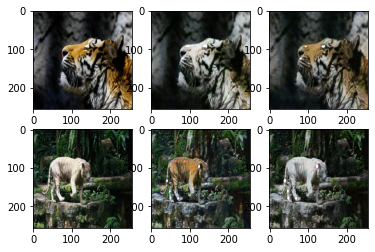

In [23]:
plot_result()

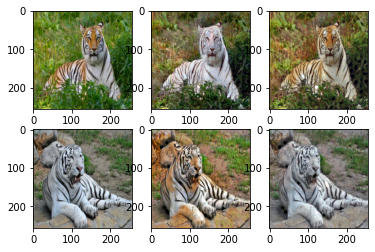

In [25]:
plot_result()

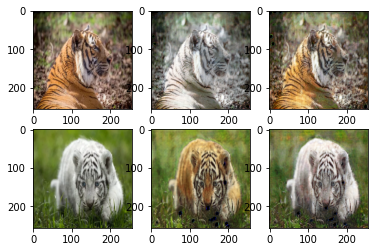

In [27]:
plot_result()